# Odd Result in Planck's Noise Simulations

There's something unexpected in Planck's noise simulations. It shows up most strongly for 545 and 857 GHz.

Contents:
- [100 GHz Simulations](#100-ghz-simulations)
- [545 GHz Simulations](#545-ghz-simulations)
- [857 GHz Simulations](#look-at-857-ghz)
- [353 GHz Simulations](#compare-to-353-ghz)
- [Similar effect in Half-mission difference maps](#half-mission-maps-contain-similar-phenomenon)

## Boilerplate

In [1]:
import logging
import sys
import numpy as np
import healpy as hp
import matplotlib.pyplot as plt
import pysm3.units as u

from cmbml.utils.handle_data import get_planck_obs_data, get_planck_noise_data, get_planck_hm_data
from cmbml.utils.fits_inspection import get_field_unit

from system_config import ASSETS_DIRECTORY, NOISE_DIRECTORY

In [2]:
# Logging was helpful when debugging my handle_data module
logging.basicConfig(
    level=logging.WARNING,  # If DEBUG, there's a bunch of PySM3 and Matplotlib stuff
    format='%(levelname)s - %(message)s',
    handlers=[logging.StreamHandler(sys.stdout)]
)

# 100 GHz Simulations

For reference, here's what I've been seeing a lot working with Planck's noise simulations.

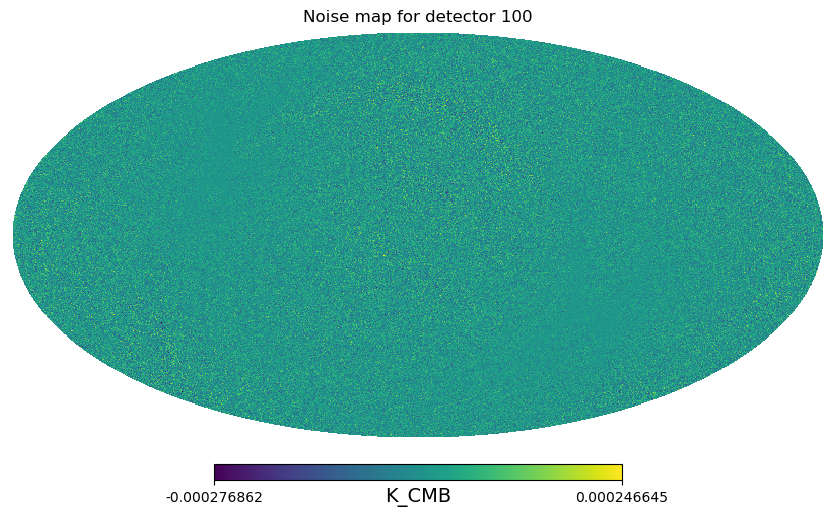

In [20]:
DET = 100
nse_fn = get_planck_noise_data(detector=DET, assets_directory=NOISE_DIRECTORY, realization=0)
nse_unit = get_field_unit(nse_fn, hdu=1, field_idx=0)
nse_unit = u.Unit(nse_unit)
nse_map = hp.read_map(nse_fn, field=0)
hp.mollview(nse_map, unit=nse_unit, title=f'Noise map for detector {DET}')

# 545 GHz Simulations

In [3]:
DET = 545
# Get observations
obs_fn = get_planck_obs_data(detector=DET, assets_directory=ASSETS_DIRECTORY)
nse_fn0 = get_planck_noise_data(detector=DET, assets_directory=NOISE_DIRECTORY, realization=0)
nse_fn1 = get_planck_noise_data(detector=DET, assets_directory=NOISE_DIRECTORY, realization=1)
obs = hp.read_map(obs_fn)
nse0 = hp.read_map(nse_fn0)
nse1 = hp.read_map(nse_fn1)
obs_unit = get_field_unit(obs_fn, hdu=1, field_idx=0)
obs_unit = u.Unit(obs_unit)
nse_unit = get_field_unit(nse_fn0, hdu=1, field_idx=0)
nse_unit = u.Unit(nse_unit)
obs_unit, nse_unit

We plot the simulation noise with a scale such that the (expected) background noise is visible.

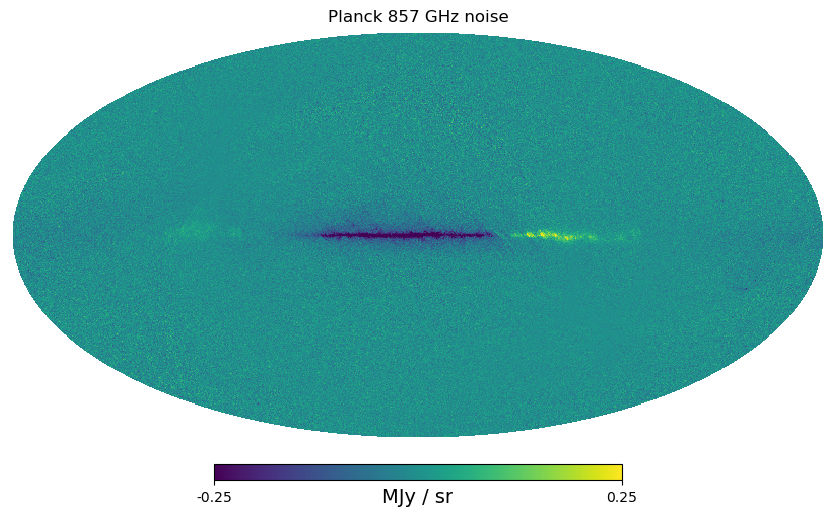

In [17]:
moll_plot_params = dict(unit=obs_unit)
min_max = dict(min=-0.25, max=0.25)
hp.mollview(nse0, title=f'Planck {DET} GHz noise', **moll_plot_params|min_max)

A larger scale is needed to view the observations. Viewed this way I wonder if noise is even relevant for these detectors.

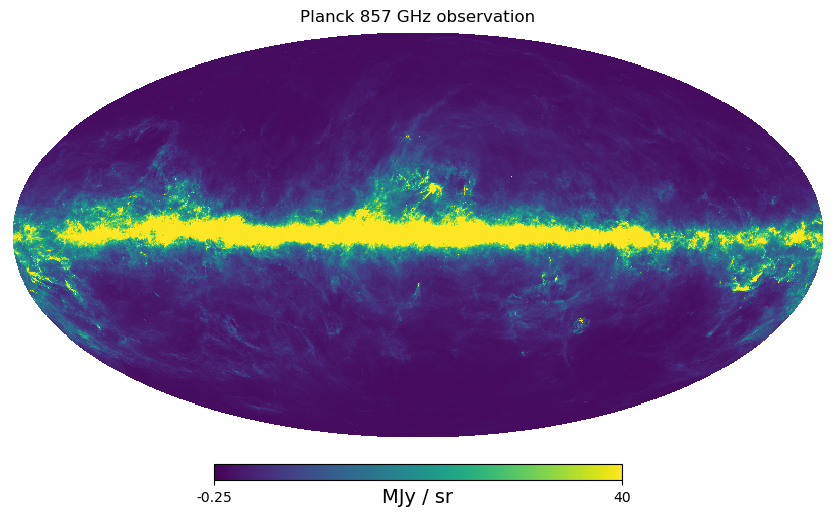

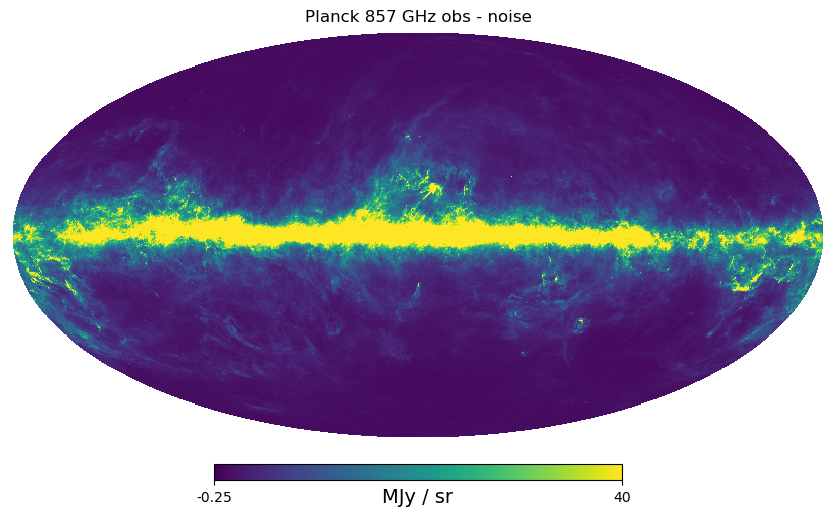

In [18]:
min_max2 = dict(min=-0.25, max=40)
hp.mollview(obs, title=f'Planck {DET} GHz observation', **moll_plot_params|min_max2)
hp.mollview(obs - nse0, title=f'Planck {DET} GHz obs - noise', **moll_plot_params|min_max2)

When we zoom in, it does reveal some minor difference (and if my eyes can see it, the math certainly will). Compare especially regions that appear flat.

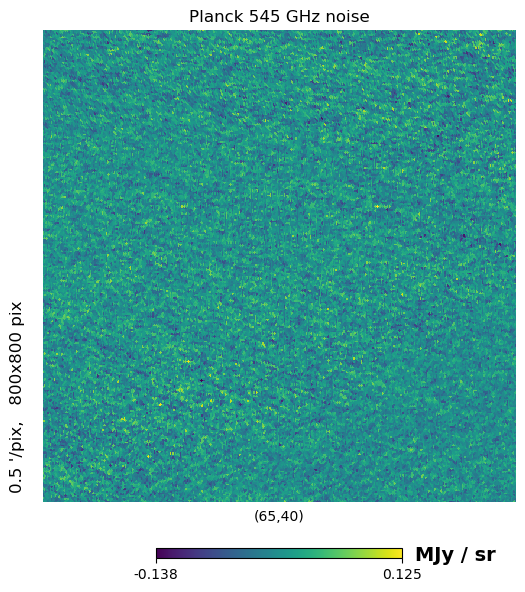

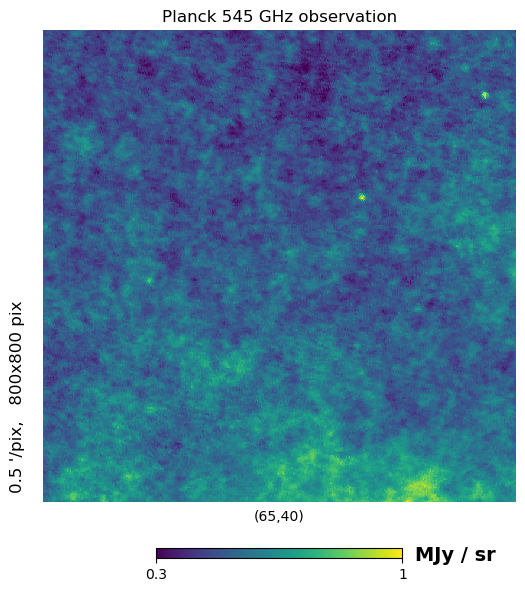

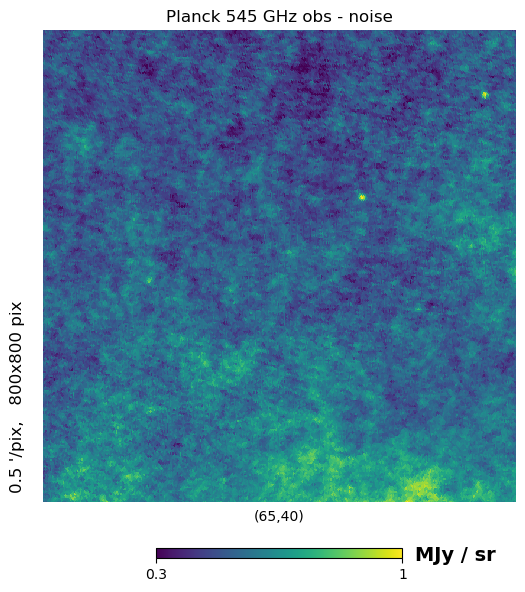

In [10]:
gnom_plot_params = dict(rot=[65, 40, 0], unit=obs_unit, reso=0.5, xsize=800)
min_max = dict(min=0.3, max=1)
hp.gnomview(nse0, title=f'Planck {DET} GHz noise', **gnom_plot_params)
hp.gnomview(obs, title=f'Planck {DET} GHz observation', **{**min_max,  **gnom_plot_params})
hp.gnomview(obs - nse0, title=f'Planck {DET} GHz obs - noise', **{**min_max, **gnom_plot_params})

# 857 GHz Simulation

We see less than was in 545, but still some stuff.

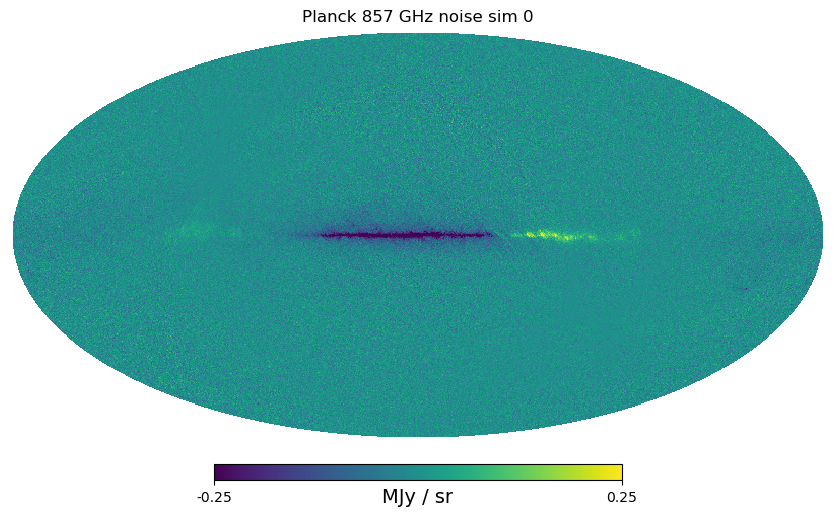

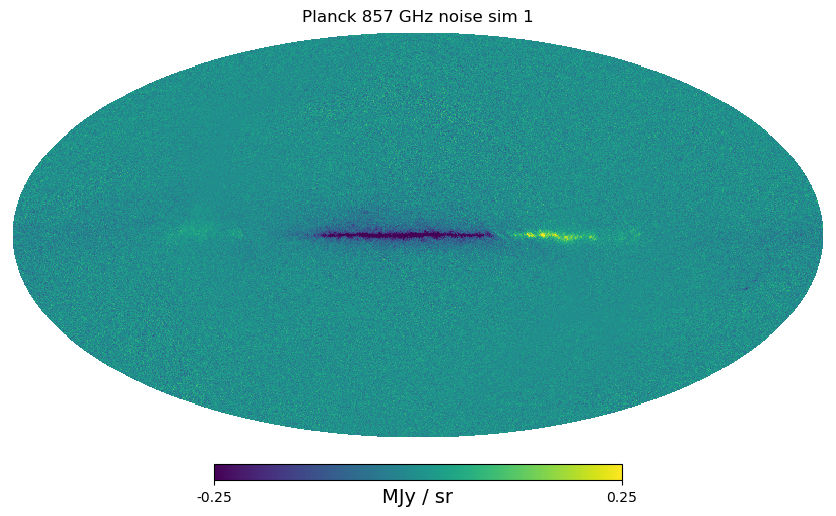

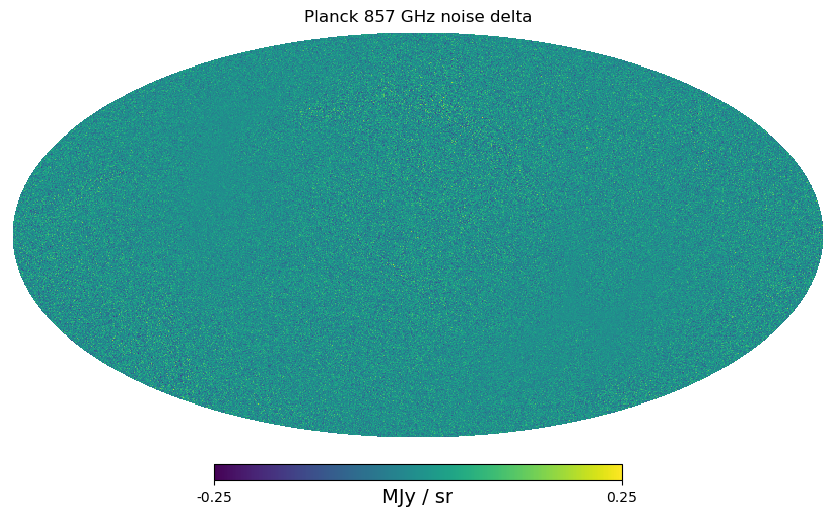

In [19]:
# Get observations
DET = 857
# Get filenames
obs_fn = get_planck_obs_data(detector=DET, assets_directory=ASSETS_DIRECTORY)
nse_fn0 = get_planck_noise_data(detector=DET, assets_directory=NOISE_DIRECTORY, realization=0)
nse_fn1 = get_planck_noise_data(detector=DET, assets_directory=NOISE_DIRECTORY, realization=1)
# Load maps
obs = hp.read_map(obs_fn)
nse0 = hp.read_map(nse_fn0)
nse1 = hp.read_map(nse_fn1)
# Get map units
obs_unit = get_field_unit(obs_fn, hdu=1, field_idx=0)
obs_unit = u.Unit(obs_unit)
nse_unit = get_field_unit(nse_fn0, hdu=1, field_idx=0)
nse_unit = u.Unit(nse_unit)
# Setup and plot maps
moll_plot_params = dict(unit=obs_unit)
min_max = dict(min=-0.25, max=0.25)
# min_max = dict(min=-0.1, max=0.1)
hp.mollview(nse0, title=f'Planck {DET} GHz noise sim 0', **moll_plot_params|min_max)
hp.mollview(nse1, title=f'Planck {DET} GHz noise sim 1', **moll_plot_params|min_max)
hp.mollview(nse1 - nse0, title=f'Planck {DET} GHz noise delta', **moll_plot_params|min_max)

# Compare to 353 GHz

At 353, we do see ***some*** galactic stuff, but apparently only sometimes (it surprised me when I did this). Maybe the fixed signal is a dampening around the galactic plane. We see it only when the mean noise across all the sky is similar to this galactic "signal".

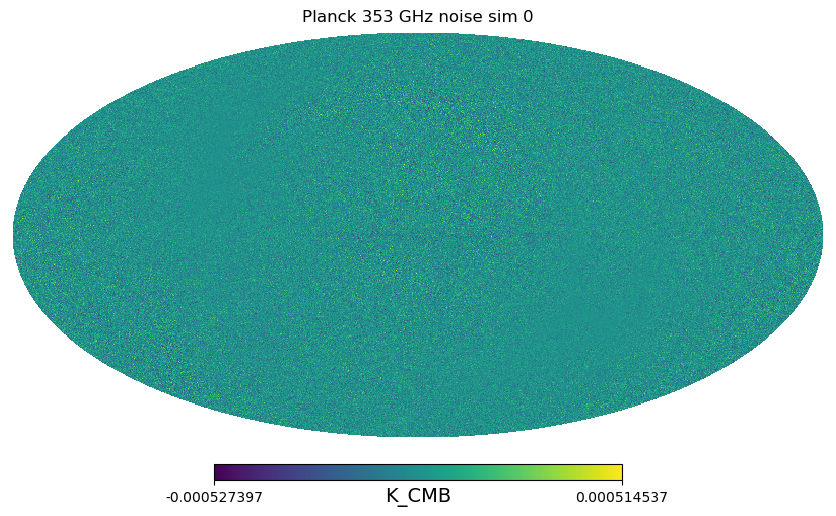

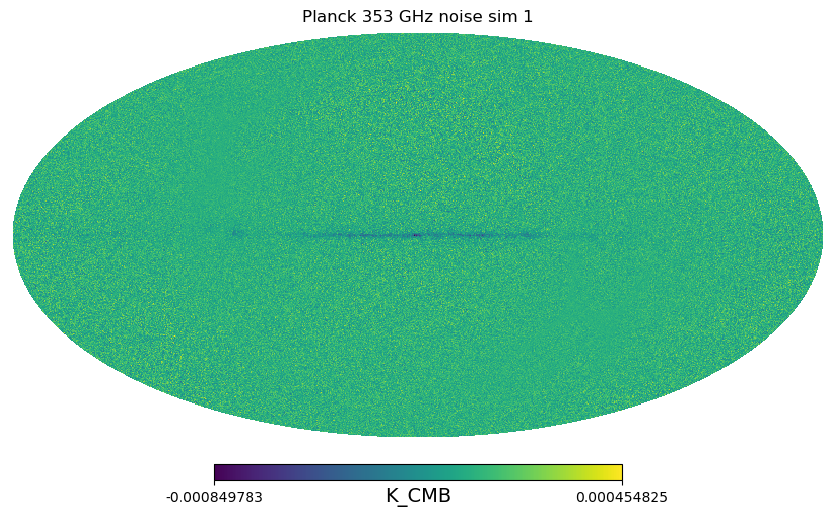

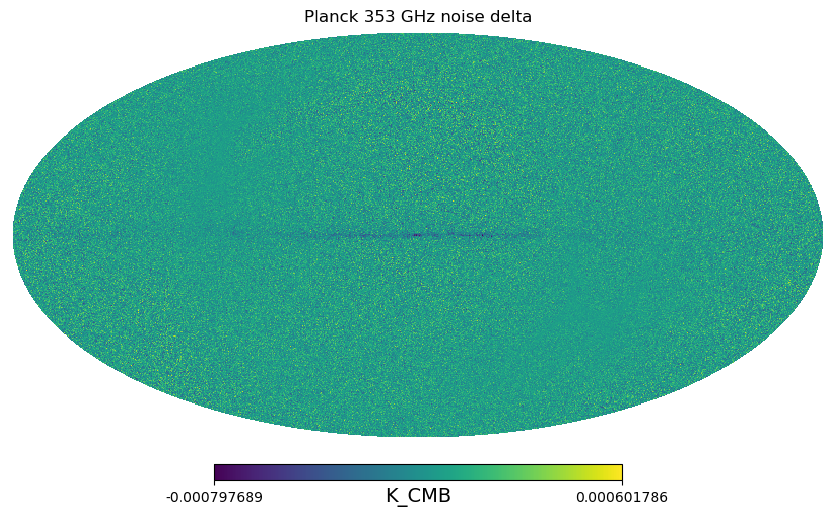

In [11]:
# Get observations
DET = 353
# Get filenames
obs_fn = get_planck_obs_data(detector=DET, assets_directory=ASSETS_DIRECTORY)
nse_fn0 = get_planck_noise_data(detector=DET, assets_directory=NOISE_DIRECTORY, realization=0)
nse_fn1 = get_planck_noise_data(detector=DET, assets_directory=NOISE_DIRECTORY, realization=1)
# Load maps
obs = hp.read_map(obs_fn)
nse0 = hp.read_map(nse_fn0)
nse1 = hp.read_map(nse_fn1)
# Get map units
obs_unit = get_field_unit(obs_fn, hdu=1, field_idx=0)
obs_unit = u.Unit(obs_unit)
nse_unit = get_field_unit(nse_fn0, hdu=1, field_idx=0)
nse_unit = u.Unit(nse_unit)
# Setup and plot maps
moll_plot_params = dict(unit=obs_unit)
min_max = dict(min=None, max=None)
# min_max = dict(min=-0.1, max=0.1)
hp.mollview(nse0, title=f'Planck {DET} GHz noise sim 0', **moll_plot_params|min_max)
hp.mollview(nse1, title=f'Planck {DET} GHz noise sim 1', **moll_plot_params|min_max)
# hp.mollview(nse1 - nse0, title=f'Planck {DET} GHz noise delta', **moll_plot_params|min_max)

# Half-mission Maps contain similar phenomenon

There is something that shows up around these areas for the Half-mission maps. It's ... alternatively very large or small in these maps. I guess in the simulations they know it's uniform?

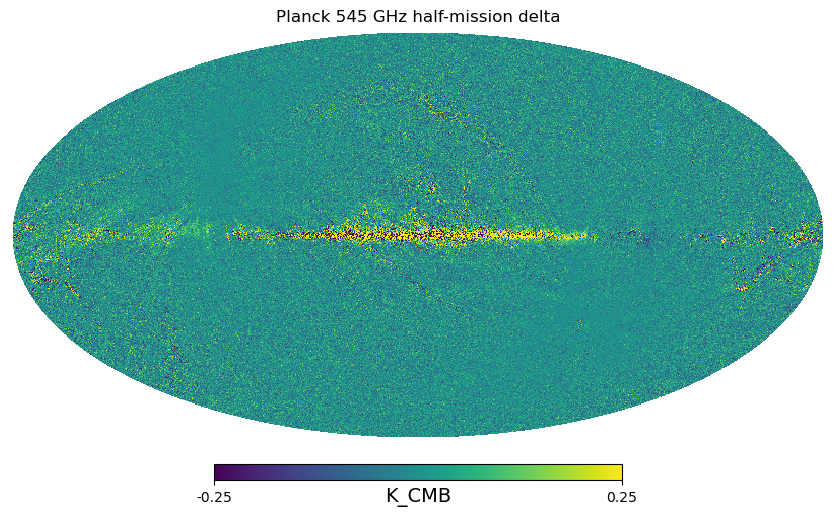

In [13]:
det545 = 545
hm545a_fn, hm545b_fn = get_planck_hm_data(det545, assets_directory=ASSETS_DIRECTORY, progress=True)
hm545a = hp.read_map(hm545a_fn)
hm545b = hp.read_map(hm545b_fn)

obs_unit = get_field_unit(hm545a_fn, hdu=1, field_idx=0)
obs_unit = u.Unit(obs_unit)
nse_unit = get_field_unit(nse_fn0, hdu=1, field_idx=0)
nse_unit = u.Unit(nse_unit)
obs_unit, nse_unit

moll_plot_params = dict(unit=obs_unit)
min_max = dict(min=-0.25, max=0.25)

# hp.mollview(hm545a, title=f'Planck {det545} GHz half-mission 1', **moll_plot_params|min_max)
# hp.mollview(hm545b, title=f'Planck {det545} GHz half-mission 2', **moll_plot_params|min_max)
hp.mollview(hm545b - hm545a, title=f'Planck {det545} GHz half-mission delta', **moll_plot_params|min_max)

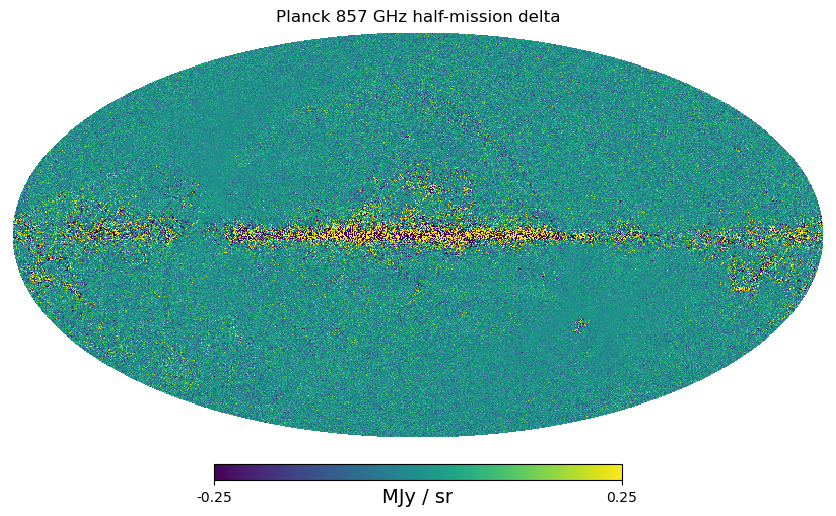

In [16]:
det857 = 857
hm857a_fn, hm857b_fn = get_planck_hm_data(det857, assets_directory=ASSETS_DIRECTORY, progress=True)
hm857a = hp.read_map(hm857a_fn)
hm857b = hp.read_map(hm857b_fn)

min_max = dict(min=-0.25, max=0.25)

# hp.mollview(hm857a, title=f'Planck {det857} GHz half-mission 1', **moll_plot_params|min_max)
# hp.mollview(hm857b, title=f'Planck {det857} GHz half-mission 2', **moll_plot_params|min_max)
hp.mollview(hm857b - hm857a, title=f'Planck {det857} GHz half-mission delta', **moll_plot_params|min_max)